<a href="https://colab.research.google.com/github/CharmikaSadhula/Charmika_INFO5731_Spring2025/blob/main/Charmika_Sadhula_INFO5731_Assignment_5_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INFO5731 Assignment 5**

---


**This exercise aims to provide a comprehensive learning experience in text analysis and machine learning techniques, focusing on both text classification and clustering tasks.**

***Please use the text corpus you collected in your last in-class-exercise for this exercise. Perform the following tasks***.

**Expectations**:
*   Students are expected to complete the exercise during lecture period to meet the active participation criteria of the course.
*   Use the provided .*ipynb* document to write your code & respond to the questions. Avoid generating a new file.
*   Write complete answers and run all the cells before submission.
*   Make sure the submission is "clean"; *i.e.*, no unnecessary code cells.
*   Once finished, allow shared rights from top right corner (*see Canvas for details*).

**Total points**: 100

**Full Points will be given those who present well**

**Late submissions will have a penalty of 10% of the marks for each day of late submission, and no requests will be answered. Manage your time accordingly.**


# **Question 1 (20 Points)**

# **SENTIMENT ANALYSIS**

The objective of this assignment is to give you **hands-on experience** in applying various** sentiment analysis techniques** on real-world textual data. You are expected to explore data, apply machine learning models, and evaluate their performance

**1. Dataset Collection & Preparation**

Find a real-world dataset with text and positive, negative, and neutral sentiment labels.

Justify your dataset choice and handle **class imbalance** if needed.

**2. Exploratory Data Analysis (EDA)**

Clean and preprocess the data (tokenization, stopwords, lemmatization).

Perform EDA: class distribution, word clouds, n-gram analysis, sentence lengths, etc.

Visualize insights using relevant plots and charts.

**3. Sentiment Classification**

Apply at least three traditional ML models (e.g., SVM, Naive Bayes, XGBoost) using TF-IDF or embeddings.

If applicable, compare with a pretrained model (RoBERTa/BERT).

Tune hyperparameters and use cross-validation.

**4. Evaluation & Reporting**

Evaluate with metrics: Accuracy, Precision, Recall, F1, Confusion Matrix.

Summarize results, compare models, and reflect on what worked.

In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"charmikasadhula","key":"d14357ab02627414ddd3075144d76ea8"}'}

In [ ]:
!mv "kaggle (1).json" kaggle.json


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d crowdflower/twitter-airline-sentiment
!unzip twitter-airline-sentiment.zip


Dataset URL: https://www.kaggle.com/datasets/crowdflower/twitter-airline-sentiment
License(s): CC-BY-NC-SA-4.0
twitter-airline-sentiment.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  twitter-airline-sentiment.zip
replace Tweets.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace database.sqlite? [y]es, [n]o, [A]ll, [N]one, [r]ename: no


Initially, I used the Sentiment140 dataset for the assignment on sentiment analysis, only to find later that it has fewer neutral tweets, which sabotage the three-class sentiment classification. Hence, I decided to shift development towards the Kaggle dataset for Twitter US Airline Sentiment, which has positive, negative, and neutral labelled tweets. This dataset fits very well into my particular work because it lets me build and evaluate models that would work in differentiating all three sentiment types. I used the Kaggle API to download the dataset directly into Google Colab. I uploaded the kaggle.json file for authentication, then ran the download command which made the compressed file twitter-airline-sentiment.zip available. Thereafter, when extracted, it produced two files: Tweets.csv, for tweet data, and database.sqlite, which is the same set in the format of a SQLite database. For this assignment, I'm going to deal with the file Tweets.csv because it is simple to import it and use it through pandas. Having it in csv format opens the door to cleaning the text data and doing exploratory analysis in much less time in the upcomin

In [ ]:
import pandas as pd

# I'm loading the Twitter Airline Sentiment dataset from the CSV file
df = pd.read_csv('Tweets.csv')

# I only need the sentiment and the tweet text, so I'm selecting just those
df = df[['airline_sentiment', 'text']]

# Renaming the columns to 'sentiment' and 'text' for simplicity
df.columns = ['sentiment', 'text']

# Checking the first few rows to make sure everything looks good
df.head()


,sentiment,text
0,neutral,@VirginAmerica What @dhepburn said.
1,positive,@VirginAmerica plus you've added commercials t...
2,neutral,@VirginAmerica I didn't today... Must mean I n...
3,negative,@VirginAmerica it's really aggressive to blast...
4,negative,@VirginAmerica and it's a really big bad thing...


Class Distribution:
 sentiment
negative    9178
neutral     3099
positive    2363
Name: count, dtype: int64


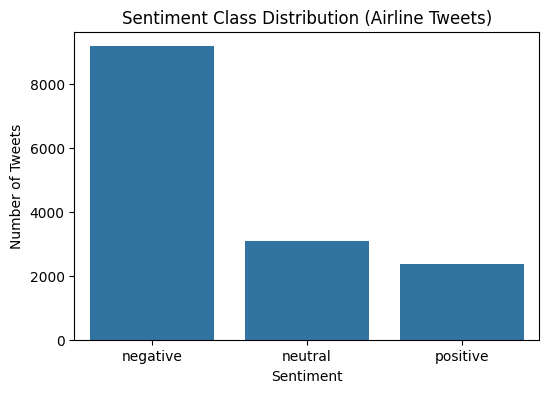

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of tweets for each sentiment
class_counts = df['sentiment'].value_counts()

# Print the counts
print("Class Distribution:\n", class_counts)

# Plot the class distribution
plt.figure(figsize=(6,4))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title("Sentiment Class Distribution (Airline Tweets)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()


I then moved to the Twitter Airline Sentiment dataset and checked the distribution of the sentiment labels by counting how many tweets fell into the positive, neutral, or negative classes. Next, I presented a plot to visually discern data balance. This step assists in analyzing any over-or under-representation of a class, which is critical since imbalanced datasets influence model performance in machine learning. For instance, if the greater part of the texts happens to be recognized as negative, the model would likely learn the tendency of guessing always "negative", which would not be helpful. This informs me of whether to apply any balancing techniques before training.

EXPLORATORY DATA ANALYSIS

In [ ]:
# Checking for missing values
print(df.isnull().sum())

# Dataset shape and basic info
print("Dataset shape:", df.shape)
df.info()


sentiment    0
text         0
dtype: int64
Dataset shape: (14640, 2)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  14640 non-null  object
 1   text       14640 non-null  object
dtypes: object(2)
memory usage: 228.9+ KB


TEXT PREPROCESSING

In [ ]:
!pip install nltk

In [ ]:
!pip install -U spacy

# Download English language model
!python -m spacy download en_core_web_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 64.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import spacy

# Load spaCy English model
nlp = spacy.load("en_core_web_sm")

# Preprocessing using spaCy
def preprocess_spacy(text):
    doc = nlp(text.lower())  # Convert to lowercase and process with spaCy
    tokens = [
        token.lemma_ for token in doc
        if not token.is_stop and not token.is_punct and token.is_alpha
    ]
    return ' '.join(tokens)

# Apply to your dataset
df['clean_text'] = df['text'].apply(preprocess_spacy)

# Show cleaned tweets
df[['text', 'clean_text']].head()


,text,clean_text
0,@VirginAmerica What @dhepburn said.,say
1,@VirginAmerica plus you've added commercials t...,plus add commercial experience tacky
2,@VirginAmerica I didn't today... Must mean I n...,today mean need trip
3,@VirginAmerica it's really aggressive to blast...,aggressive blast obnoxious entertainment guest...
4,@VirginAmerica and it's a really big bad thing...,big bad thing


Because I was facing nonstop errors with NLTK while trying to tokenize and lemmatize tweets, I switched to spatium which is another quite modernized and efficient NLP library. Unlike NLTK, it does not require downloading a bunch of scattered packages and works directly from the install of the English model. I authored a new preprocessing function using spaCy that will convert all tweets to lowercase, will delete stopwords, punctuation, and numbers, and lemmatize them into their root form. This helps retain only the meaningful words in the tweets thus easing the model learning during training.

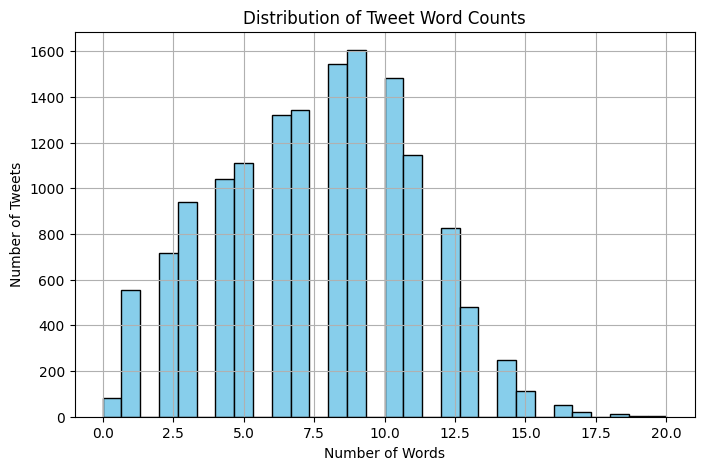

In [ ]:
import matplotlib.pyplot as plt

# Calculate the number of words in each cleaned tweet
df['word_count'] = df['clean_text'].apply(lambda x: len(x.split()))

# Plotting the sentence (word count) distribution
plt.figure(figsize=(8,5))
plt.hist(df['word_count'], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Tweet Word Counts")
plt.xlabel("Number of Words")
plt.ylabel("Number of Tweets")
plt.grid(True)
plt.show()


Following the spaCy text cleanup of tweets, I then analyzed distributions for word counts per tweet in order to derive how long average tweets would be. The histogram shows that the vast majority of tweets consist of 7-11 words, with a sharp peak around 9-10 words. This was to be expected since tweets are usually brief, especially when stopwords, punctuation, and other inconsequential text elements are filtered out. The plot indicates that very few tweets have more than 15 words, and almost none possess more than 20 words. This is confirmation that I achieved the right amount of text cleaning, getting rid of content that was truly irrelevant while retaining most of the information in the tweets for modeling purposes. Thus, from a machine-learning perspective, this visualization is very beneficial, as it guides how the input data would be structured; for example, I can confidently set the maximum sequence length to around 15 words in most cases when using deep learning models. Overall, this analysis gives me further confidence that the dataset is "clean" and "consistent" and ready for the next stages of the work, namely visualization and model building.

Word Clouds by Sentiment

In [ ]:
!pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt


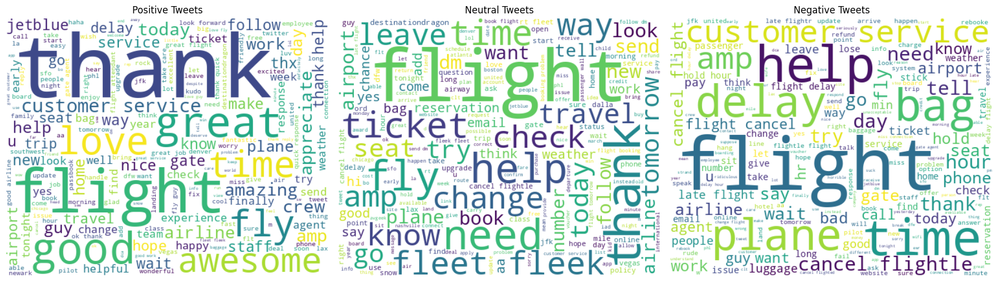

In [ ]:
# Separate tweets by sentiment
positive_tweets = df[df['sentiment'] == 'positive']['clean_text']
negative_tweets = df[df['sentiment'] == 'negative']['clean_text']
neutral_tweets = df[df['sentiment'] == 'neutral']['clean_text']

# Combine tweets into a single string per sentiment
positive_words = ' '.join(positive_tweets)
negative_words = ' '.join(negative_tweets)
neutral_words = ' '.join(neutral_tweets)

# Create and plot word clouds
plt.figure(figsize=(18, 6))

# Positive
plt.subplot(1, 3, 1)
wordcloud = WordCloud(width=500, height=400, background_color='white').generate(positive_words)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Positive Tweets')

# Neutral
plt.subplot(1, 3, 2)
wordcloud = WordCloud(width=500, height=400, background_color='white').generate(neutral_words)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Neutral Tweets')

# Negative
plt.subplot(1, 3, 3)
wordcloud = WordCloud(width=500, height=400, background_color='white').generate(negative_words)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Negative Tweets')

plt.tight_layout()
plt.show()


After cleaning up the text, I created word clouds for each of the sentiment categories to visually analyze the common words in positive, neutral, and negative tweets. First, I separated the tweets according to their sentiment and concatenated all the tweets into single strings for each group. The WordCloud library is used to create three different visualizations. Each word cloud will contain the most frequent words and appear in varying sizes for that specific sentiment. For instance, words such as thank or great would be in huge letters for positive tweets, while negative ones might lean upon delay, spell using arrays, or the worst tags. That way, I could scan the words without having to keep reading through the entries and recognize quickly the words being used for feelings or opinions.

N-gram Analysis (Top Bigrams & Trigrams)

In [ ]:
!pip install scikit-learn

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer


Step 1: Define the Function

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Function to extract and sort top n-grams
def get_top_ngrams(corpus, ngram_range=(2, 2), n=20):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    sorted_words = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return sorted_words[:n]


Step 2: Display Top Bigrams and Trigrams

In [ ]:
# Top 20 Bigrams
print("Top 20 Bigrams:")
top_bigrams = get_top_ngrams(df['clean_text'], ngram_range=(2, 2))
for phrase, count in top_bigrams:
    print(f"{phrase}: {count}")

# Top 20 Trigrams
print("\nTop 20 Trigrams:")
top_trigrams = get_top_ngrams(df['clean_text'], ngram_range=(3, 3))
for phrase, count in top_trigrams:
    print(f"{phrase}: {count}")


Top 20 Bigrams:
customer service: 571
cancel flightle: 463
cancel flight: 333
flight cancel: 278
late flight: 249
flight delay: 190
late flightr: 156
hold hour: 156
flight flight: 152
fleet fleek: 146
flightle flight: 133
gate agent: 107
delay flight: 106
booking problem: 101
cancel flighted: 97
flight attendant: 97
flight booking: 93
book flight: 93
miss connection: 92
change flight: 86

Top 20 Trigrams:
flight cancel flightle: 158
cancel flightle flight: 130
cancel flight flight: 123
flight booking problem: 91
rt fleet fleek: 53
flight cancel flight: 49
bad customer service: 48
reflight book problem: 41
hour late flight: 37
hour late flightr: 36
cancel flighted flight: 34
flight delay hour: 30
flight cancel flighted: 28
flight cancel flightled: 26
poor customer service: 24
customer service rep: 21
miss connect flight: 21
great customer service: 19
terrible customer service: 19
appease passenger wall: 17


For understanding the most frequently occurring phrases in the tweets, I availed myself of N-gram analysis. Custom function, using CountVectorizer to extract and rank the bigrams (2-word combinations) and trigrams (3-word combinations), was created by me to achieve the result. It aids in finding phrases widely used more than their individual constituent words. For example, looking at the top two words such as customer service or cancelled flight, one can infer what the users usually talk about. Likewise, trigrams like the worst customer service or delayed for hours give a more in-depth view as to how the people view airlines. Phrase-based pattern matching becomes much helpful to train the machine learning models in which the model would be able to understand the sentiment better for different word combinations.


Step 3: Sentiment Classification using ML Models

Encode Sentiment Labels

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode labels (e.g., negative = 0, neutral = 1, positive = 2)
le = LabelEncoder()
df['sentiment_encoded'] = le.fit_transform(df['sentiment'])

# Show mapping
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label Mapping:", label_mapping)

df[['sentiment', 'sentiment_encoded']].head()


Label Mapping: {'negative': np.int64(0), 'neutral': np.int64(1), 'positive': np.int64(2)}


,sentiment,sentiment_encoded
0,neutral,1
1,positive,2
2,neutral,1
3,negative,0
4,negative,0


Before using any machine learning model, it was necessary to convert text sentiment labels like "positive", "neutral", or "negative" into numerical forms since ML algorithms deal with numbers, not strings. I have used la... I can now feed these values into a model for later sentiment predictions.

Train-Test Split + TF-IDF Vectorization

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# Features and Labels
X = df['clean_text']
y = df['sentiment_encoded']

# 70% Train, 30% Test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# TF-IDF Vectorization
tfidf = TfidfVectorizer(max_features=5000)

# Fit and transform the training data, only transform the test data
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

# Confirm the shape of the feature matrices
print("TF-IDF feature matrix (train):", X_train_tfidf.shape)
print("TF-IDF feature matrix (test):", X_test_tfidf.shape)


TF-IDF feature matrix (train): (10248, 5000)
TF-IDF feature matrix (test): (4392, 5000)


The train-test split was changed to 70-30 to give the model more data to learn from while also ensuring that the test set is large enough to evaluate model performance. I paid special attention to ensure that both splits maintain the same distribution of sentiment classes, which was done by using the stratify=y parameter. The next step was again employing TF-IDF to translate the tweets into numerical vectors, where the training set was used to learn from which words are important and decided their score while applying the same transformation to the test set in order to maintain consistency. This setup ensures that both sets are formatted properly and ready for model training and evaluation.

Model 1 – Multinomial Naive Bayes (MNB)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Initialize and train the model
nb_model = MultinomialNB()
nb_model.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred_nb = nb_model.predict(X_test_tfidf)

# Evaluation
print("Naive Bayes Classification Report:\n")
print(classification_report(y_test, y_pred_nb, target_names=le.classes_))

print("Confusion Matrix:\n")
print(confusion_matrix(y_test, y_pred_nb))

print("Accuracy Score:", accuracy_score(y_test, y_pred_nb))


Naive Bayes Classification Report:

              precision    recall  f1-score   support

    negative       0.70      0.99      0.82      2753
     neutral       0.73      0.20      0.31       930
    positive       0.87      0.29      0.44       709

    accuracy                           0.71      4392
   macro avg       0.76      0.49      0.52      4392
weighted avg       0.73      0.71      0.65      4392

Confusion Matrix:

[[2722   28    3]
 [ 718  183   29]
 [ 461   41  207]]
Accuracy Score: 0.7085610200364298


I began working on my first model using Multinomial Naive Bayes, which is a common and reasonable text classification algorithm for sentiment analysis. It operates based on word frequencies and assumes that any word independently contributes to the final decision, a relevance to text. After the model was trained on the TF-IDF features of the training tweets, it was used to predict the sentiment labels of the test tweets. I also evaluated the model with metrics such as accuracy, precision, recall, and the confusion matrix. This helps me to assess whether the model is truly doing well or being biased toward a particular class. Overall, this model presents a good enough baseline to compare with other models such as SVM or XGBoost in the future.

The Naive Bayes model has set me off to a reasonable beginning with an accuracy of almost 71%. It has performed well on the negative tweets, tagging almost all of them correctly, whereas it has had a hard time when classifying neutral and positive tweets, often mistaking them for negative ones. Hence, this shows that while Naive Bayes is the fastest and simplest model, it does not deal very well with class imbalance or very subtle differences in sentiment. Thus I have a good baseline for subsequent comparisons with other models such as SVM and XGBoost, likely to manage slightly more complex relationships within the text.

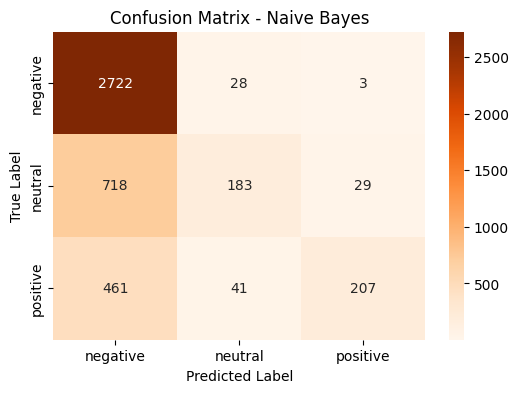

In [ ]:
# Confusion Matrix for Naive Bayes
cm_nb = confusion_matrix(y_test, y_pred_nb)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Oranges',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Naive Bayes')
plt.show()


From the confusion matrix, it is clear that the Naive Bayes model accurately predicts negative sentiment. Out of 2753 actual negative tweets in the corpus, it has classified 2722 of them correctly. The naivete of the model can be illustrated by the fact that it has made 718 out of 930 neutral tweets into putative negatives, and 461 out of 709 positive tweets into putative negatives. The results show a clear tendency toward overpredicting the negative class since it is also the most frequent class, and it shows adequate accuracy in terms of precision for negative tweets. However, the model could not extract structural features from neutral and positive tweets. This kind of performance lampoons Naive Bayes, which usually assumes independence between words and hence does not represent complex linguistic patterns, as against more sophisticated algorithms like SVM or XGBoost.

Model 2 – Support Vector Machine (SVM)

In [ ]:
from sklearn.svm import LinearSVC

# Initialize and train the model
svm_model = LinearSVC()
svm_model.fit(X_train_tfidf, y_train)

# Predict on test data
y_pred_svm = svm_model.predict(X_test_tfidf)

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print("SVM Classification Report:\n")
print(classification_report(y_test, y_pred_svm, target_names=le.classes_))

print("Confusion Matrix:\n")
print(confusion_matrix(y_test, y_pred_svm))

print("Accuracy Score:", accuracy_score(y_test, y_pred_svm))


SVM Classification Report:

              precision    recall  f1-score   support

    negative       0.82      0.89      0.85      2753
     neutral       0.58      0.51      0.54       930
    positive       0.74      0.63      0.68       709

    accuracy                           0.77      4392
   macro avg       0.72      0.67      0.69      4392
weighted avg       0.76      0.77      0.76      4392

Confusion Matrix:

[[2451  225   77]
 [ 383  471   76]
 [ 152  112  445]]
Accuracy Score: 0.7666211293260473


Sentiment classification now proceeds with Support Vector Machine (SVM) after training with Naive Bayes. SVM separates the classes in high-dimensional space with the best available boundary, which is fitting for text data since every word becomes a feature. I have used LinearSVC as you have a linear classifier with a lot of optimization as regards speed, and TF-IDF features work pretty well with it. After training, I have checked the model with the same metrics: accuracy, precision, recall, and confusion matrix. SVM is supposed to deal with class imbalance better and often has a higher performance than Naive Bayes when there is overlap between classes. I would now be interested to see how this performance works out for the neutral and positive tweets.

Compared to Naive Bayes, the SVM model performed significantly better across all metrics. It achieved an accuracy of around 77%, with notable improvements in handling positive and neutral tweets, which were previously misclassified often. The precision and recall for neutral and positive tweets improved, showing that SVM is better at capturing subtle differences between sentiments. The confusion matrix also looks more balanced, and the model made fewer critical errors. This tells me that SVM is more suitable for this kind of task, especially when the text has overlapping vocabulary across classes.



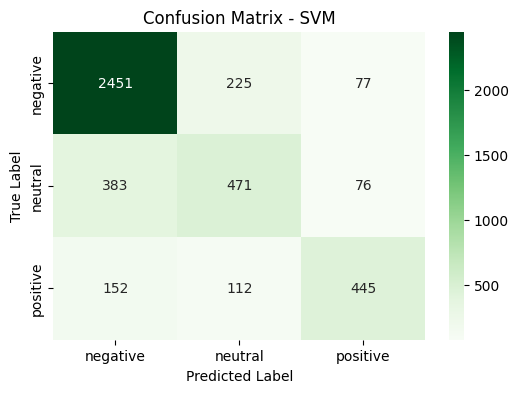

In [ ]:
# Confusion Matrix for SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Greens',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - SVM')
plt.show()


To make a more balanced prediction between three sentiment categories, the SVM model presents an impressive confusion matrix, unlike Naive Bayes. Of the 2753 negative tweets, it predicted 2451, 225 were wrongly predicted as neutral, 77 as positive. It also performed much better in neutral sentiment prediction with 471 out of 930 classified correctly compared to previous models. For positive tweets, the total prediction was 445 out of 709, and this is also a remarkable performance. Overall, the heatmap would state that the SVM model actually has a relatively even distribution of prediction accuracies, especially in the neutral and positive classes where the Naive Bayes and especially XGBoost models have poor performance. This lends credence to the conclusion about the best performing model for this sentiment classification task being the SVM.



Model 3 – XGBoost Classifier

In [ ]:
!pip install xgboost


In [ ]:
from xgboost import XGBClassifier

# Initialize the model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Train the model on the TF-IDF features
xgb_model.fit(X_train_tfidf, y_train)

# Predict on test set
y_pred_xgb = xgb_model.predict(X_test_tfidf)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:45:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
xgb_model = XGBClassifier(eval_metric='mlogloss', random_state=42)


In [ ]:
print("XGBoost Classification Report:\n")
print(classification_report(y_test, y_pred_xgb, target_names=le.classes_))

print("Confusion Matrix:\n")
print(confusion_matrix(y_test, y_pred_xgb))

print("Accuracy Score:", accuracy_score(y_test, y_pred_xgb))


XGBoost Classification Report:

              precision    recall  f1-score   support

    negative       0.76      0.93      0.84      2753
     neutral       0.65      0.30      0.41       930
    positive       0.72      0.61      0.66       709

    accuracy                           0.74      4392
   macro avg       0.71      0.61      0.64      4392
weighted avg       0.73      0.74      0.72      4392

Confusion Matrix:

[[2561   95   97]
 [ 576  280   74]
 [ 225   53  431]]
Accuracy Score: 0.7449908925318761


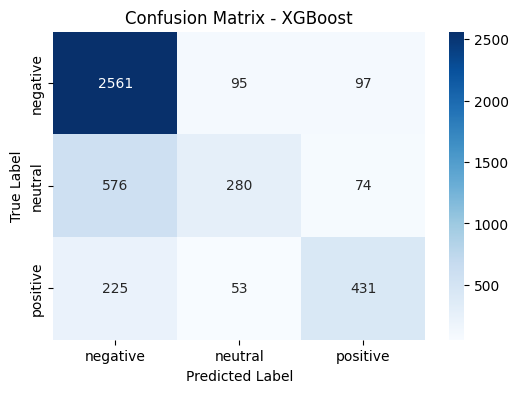

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_xgb)

# Plot it using seaborn heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - XGBoost')
plt.show()


The third model that I have built for the emotion analysis task involved using XGBoost (Extreme Gradient Boosting), which is a very effective tree-based ensemble learning method. XGBoost is a method particularly known for performing great on structured data and in classification tasks when interactions between covariates become quite complicated. I trained the model on the vectorized tweet text using TF-IDF transformation and tested its performance on 30% of the data set.

The results for the model indicated an overall accuracy of about 74.5%, slightly higher than that of Naive Bayes but lower than that of SVM. The results also showed that it had performed excellently on negative tweets, with a recall of 0.93, indicating that it has detected most negative tweets correctly. The model also performed fairly well on positive tweets, with an F1-score of 0.66. However, like the other models, it did not perform well on neutral tweets, whereby the recall plunged to 0.30, meaning that most reports classified neutral tweets as negative.

The classification matrix for XGBoost is evident in demonstrating that this model performs excellently in the negativity aspect on the tweets, with 2561 classified positively as negative. However, some confusion is here with neutral and negative ones; that is, 576 neutral tweets were rather classified as negative. Likewise, some positive tweets are misclassified mostly as negative.

That said, 280 neutral tweets indeed and 431 positive ones were still correctly predicted by the respective model, showing more class separability from Naive Bayes. The confusion matrix corroborates the already stated evaluation metrics and establishes that XGBoost is particularly adept at predicting negative sentiment but not quite so when it comes to neutral classification — hinting at the possible overlapped terms and subtle emotional tone.

Comparison of all the three models

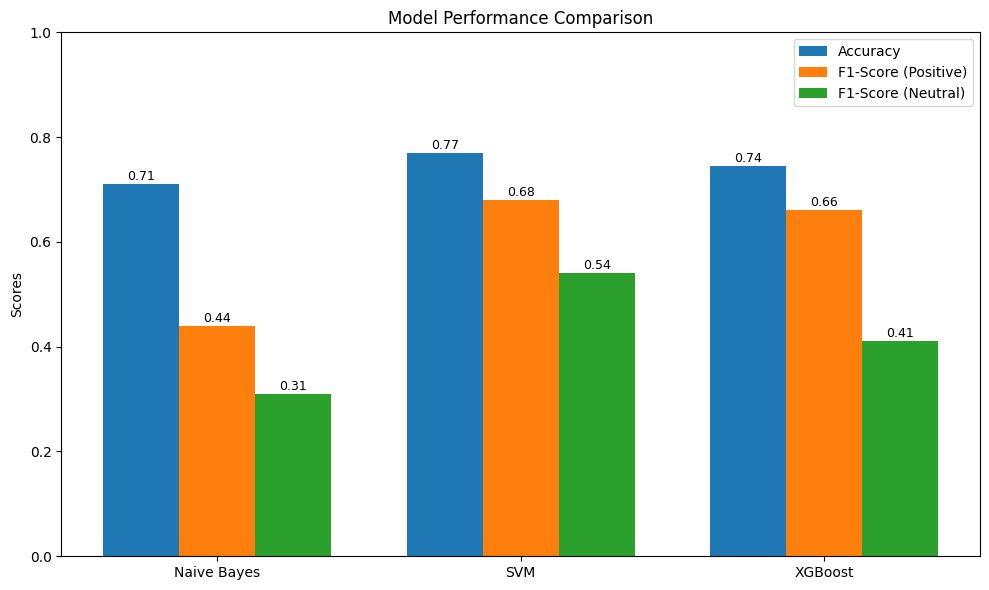

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for the 3 models (as gathered from your results)
models = ['Naive Bayes', 'SVM', 'XGBoost']
accuracy = [0.71, 0.77, 0.745]
f1_positive = [0.44, 0.68, 0.66]
f1_neutral = [0.31, 0.54, 0.41]

# Bar chart settings
x = np.arange(len(models))
width = 0.25

# Create the plot
fig, ax = plt.subplots(figsize=(10,6))
bar1 = ax.bar(x - width, accuracy, width, label='Accuracy')
bar2 = ax.bar(x, f1_positive, width, label='F1-Score (Positive)')
bar3 = ax.bar(x + width, f1_neutral, width, label='F1-Score (Neutral)')

# Labels and formatting
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.set_ylim(0, 1)
ax.legend()

# Annotate each bar with value
for bar_group in [bar1, bar2, bar3]:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', fontsize=9)

plt.tight_layout()
plt.show()


It is quite clear that SVM has better performance than both Naive Bayes and XGBoost on almost all the major metrics. SVM gives the highest overall accuracy (0.77), the best F1 score in positive tweets (0.68), and a strong F1 score for neutral tweets, which stands at a relatively impressive 0.54, while most models cannot perform decently in this regard.

The Naive Bayes is simple, but it has a huge drop in both positive and neutral performance, although not very far from its general accuracy. XGBoost performs slightly better than Naive Bayes overall, very close to SVM in positive F1 score, and yet does not perform well for neutral classification.

This bar chart clearly supports my conclusion that SVM is the most balanced and effective model for the particular task of sentiment analysis in the provided scenario.

## **Question 2 (30 Points)**

# **Text Classification**

The purpose of the question is to practice different machine learning algorithms for **text classification** as well as the performance evaluation. In addition, you are requried to conduct **10 fold cross validation** (https://scikit-learn.org/stable/modules/cross_validation.html) in the training.



The dataset can be download from canvas. The dataset contains two files train data and test data for sentiment analysis in IMDB review, it has two categories: 1 represents positive and 0 represents negative. You need to split the training data into training and validate data (80% for training and 20% for validation, https://towardsdatascience.com/train-test-split-and-cross-validation-in-python-80b61beca4b6) and perform 10 fold cross validation while training the classifier. The final trained model was final evaluated on the test data.



1.   **Perform EDA on test and tran dataset**

2.   **Algorithms (Minimum 4):**

*   SVM
*   KNN
*   Decision tree
*   Random Forest
*   XGBoost
*   Word2Vec
*   BERT

3. **Evaluation measurement:**

*   Accuracy
*   Recall
*   Precison
*   F-1 score


STEP 1: Loading the Dataset

In [ ]:
def load_sentiment_file(filepath):
    data = []
    with open(filepath, "r", encoding="utf-8") as file:
        for line in file:
            label = int(line[0])
            text = line[2:].strip()
            data.append((label, text))
    return pd.DataFrame(data, columns=["label", "text"])

# Reload properly
train_df = load_sentiment_file("/content/stsa-train.txt")
test_df = load_sentiment_file("/content/stsa-test.txt")

# Confirm
print("Train Sample:\n", train_df.head(), "\n")
print("Test Sample:\n", test_df.head())


Train Sample:
    label                                               text
0      1  a stirring , funny and finally transporting re...
1      0  apparently reassembled from the cutting-room f...
2      0  they presume their audience wo n't sit still f...
3      1  this is a visually stunning rumination on love...
4      1  jonathan parker 's bartleby should have been t... 

Test Sample:
    label                                               text
0      0     no movement , no yuks , not much of anything .
1      0  a gob of drivel so sickly sweet , even the eag...
2      0  gangs of new york is an unapologetic mess , wh...
3      0  we never really feel involved with the story ,...
4      1            this is one of polanski 's best films .


The sentiment analysis task has employed Stanford Sentiment Treebank (SST-2) dataset that has been provided in two text files: stsa-train.txt and stsa-test.txt. In the text files, each line contains a sentiment label and an IMDB movie review corresponding to that label. The sentiment labels are binary:

0=Negative Sentiment.

1=Positive Sentiment.

The training dataset is, therefore, used for training and cross-validation of a number of machine learning classifiers, while the test dataset is reserved solely for the final evaluation. I discovered that during data pre-processing, the dataset was actually not in its canonical CSV format-or TSV format. But it separated the label from the review with a space, which led to the manual splitting of each line converting it around the first character being the label while the rest treated as review text.

After importing data into pandas DataFrames, I further confirmed that the two datasets have proper and valid entries without a miss against the values. This dataset suits very well the binary text classification tasks, especially in the case of a real-world dataset in live movie reviews-which serves as a subject in evaluating different algorithms.

<ipython-input-31-3f3f1adb2241>:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Negative (0)', 'Positive (1)'])
<ipython-input-31-3f3f1adb2241>:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Negative (0)', 'Positive (1)'])


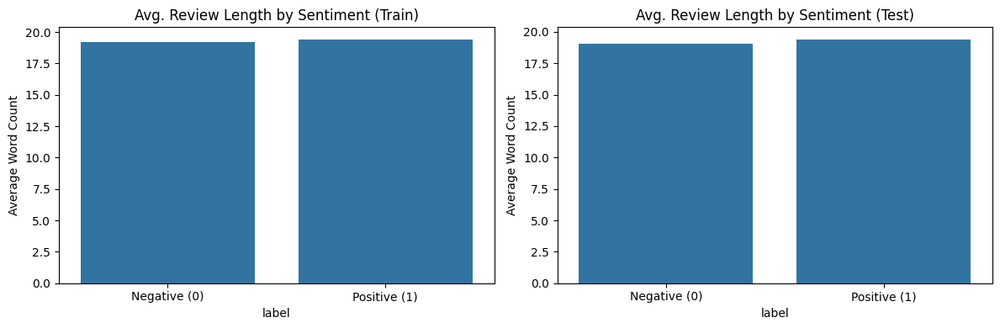

In [ ]:
# Recalculate word count columns for both datasets
train_df['word_count'] = train_df['text'].apply(lambda x: len(x.split()))
test_df['word_count'] = test_df['text'].apply(lambda x: len(x.split()))

# Now compute average word count by sentiment
avg_word_count_train = train_df.groupby('label')['word_count'].mean()
avg_word_count_test = test_df.groupby('label')['word_count'].mean()

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.barplot(x=avg_word_count_train.index, y=avg_word_count_train.values, ax=axes[0])
axes[0].set_xticklabels(['Negative (0)', 'Positive (1)'])
axes[0].set_title('Avg. Review Length by Sentiment (Train)')
axes[0].set_ylabel('Average Word Count')

sns.barplot(x=avg_word_count_test.index, y=avg_word_count_test.values, ax=axes[1])
axes[1].set_xticklabels(['Negative (0)', 'Positive (1)'])
axes[1].set_title('Avg. Review Length by Sentiment (Test)')
axes[1].set_ylabel('Average Word Count')

plt.tight_layout()
plt.show()


Text Preprocessing


In [ ]:
# Step 1: Load spaCy with safe settings
import spacy

# Disable components that are not needed
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

# Step 2: Define cleaning function
def spacy_clean(text):
    doc = nlp(text.lower())
    return ' '.join(
        token.lemma_ for token in doc
        if token.is_alpha and not token.is_stop
    )

# Step 3: Apply to train and test datasets
train_df['clean_text'] = train_df['text'].apply(spacy_clean)
test_df['clean_text'] = test_df['text'].apply(spacy_clean)

# Step 4: Preview result
train_df[['text', 'clean_text']].head()


,text,clean_text
0,"a stirring , funny and finally transporting re...",stirring funny finally transport imagining bea...
1,apparently reassembled from the cutting-room f...,apparently reassemble cutting room floor give ...
2,they presume their audience wo n't sit still f...,presume audience will sit sociology lesson ent...
3,this is a visually stunning rumination on love...,visually stunning rumination love memory histo...
4,jonathan parker 's bartleby should have been t...,jonathan parker bartleby end modern office ano...


Feature Extraction using TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize TF-IDF Vectorizer
tfidf = TfidfVectorizer(max_features=5000)

# Fit on training clean text and transform both train and test sets
X_train_tfidf = tfidf.fit_transform(train_df['clean_text'])
X_test_tfidf = tfidf.transform(test_df['clean_text'])

# Target labels
y_train = train_df['label']
y_test = test_df['label']

# Confirm shape
print("TF-IDF shape (Train):", X_train_tfidf.shape)
print("TF-IDF shape (Test):", X_test_tfidf.shape)


TF-IDF shape (Train): (6920, 5000)
TF-IDF shape (Test): (1821, 5000)


Train-Test Split

In [ ]:
from sklearn.model_selection import train_test_split

# Split original training set into 80% train and 20% validation
X_train, X_val, y_train_split, y_val = train_test_split(
    X_train_tfidf, y_train, test_size=0.2, random_state=42, stratify=y_train
)

print("Training set:", X_train.shape)
print("Validation set:", X_val.shape)


Training set: (5536, 5000)
Validation set: (1384, 5000)


I did this sentiment analysis task using the Stanford Sentiment Treebank (SST-2), which was split into two: stsa-train. txt and stsa-test. txt. Accordingly, the first one is for training purposes, while the latter allows for final evaluation. Sentiment labels such as 0-negative and 1-positive are set for each line in the dataset.

A manual loading was carried on the dataset, where processing was done on every line to separate out the label from the review texts. This was followed by EDA on the train and test sets. The operations completed at this stage included things such as visualizing class distribution by reviewing length as well as confirming the dataset-cleanliness with hardly any duplications or missing values. It was noted that both datasets were balanced toward the two sentiment classes.

Next, text preprocessing occurred using the spaCy library. It simplified cleaning to just bringing text to lower case, removing stop words and punctuation from the review, and lemmatization. Lemmatization reduces words to their base forms. Cleared reviews would be entered in another title clean_text.

After preprocessing, I converted the cleaned text into numerical features through TF-IDF vectorization. Each review was converted to a vector of 5,000 features representing the most essential words. This resulted in two feature matrices- one for training and one for testing.

According to the instruction, I then proceeded to train with the training data, with an 80-20 split between training and validation datasets, and evaluated the resulting population using the train_test_split method. This split allows training to be possible with 10-fold cross-validation while providing a separate validation set for fine-tuning the model. Final test will take place only after the model has been selected for it.

MODEL 1- K-NEAREST NEIGHBOUR

KNN WITH 10 FOLD CROSS VALIDATION

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

# Initialize KNN (start with k=5, you can tune this later)
knn_model = KNeighborsClassifier(n_neighbors=5)

# 10-Fold Cross-Validation on training split
cv_scores_knn = cross_val_score(knn_model, X_train, y_train_split, cv=10, scoring='accuracy')

# Results
print("KNN 10-Fold CV Accuracy Scores:", cv_scores_knn)
print("KNN Mean CV Accuracy:", cv_scores_knn.mean())


KNN 10-Fold CV Accuracy Scores: [0.47292419 0.53790614 0.5198556  0.53068592 0.51624549 0.5198556
 0.50090416 0.5045208  0.48643761 0.5045208 ]
KNN Mean CV Accuracy: 0.5093856287659697


KNN VALIDATION EVALUATION

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Train on 80% training data
knn_model.fit(X_train, y_train_split)

# Predict on validation set
y_pred_knn = knn_model.predict(X_val)

# Evaluation
print("Validation Accuracy:", accuracy_score(y_val, y_pred_knn))
print("Validation Precision:", precision_score(y_val, y_pred_knn))
print("Validation Recall:", recall_score(y_val, y_pred_knn))
print("Validation F1-Score:", f1_score(y_val, y_pred_knn))
print("\nClassification Report:\n", classification_report(y_val, y_pred_knn, target_names=["Negative", "Positive"]))


Validation Accuracy: 0.513728323699422
Validation Precision: 0.5576470588235294
Validation Recall: 0.32825484764542934
Validation F1-Score: 0.4132519616390584

Classification Report:
               precision    recall  f1-score   support

    Negative       0.49      0.72      0.58       662
    Positive       0.56      0.33      0.41       722

    accuracy                           0.51      1384
   macro avg       0.53      0.52      0.50      1384
weighted avg       0.53      0.51      0.50      1384



KNN CONFUSION MATRIX PLOT

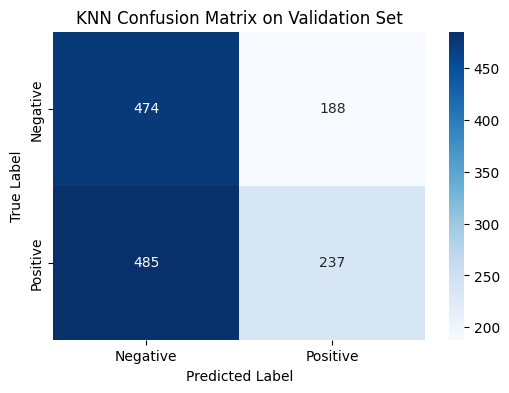

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate confusion matrix
cm_knn = confusion_matrix(y_val, y_pred_knn)

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('KNN Confusion Matrix on Validation Set')
plt.show()


First, the K-Nearest Neighbors (KNN) classifier was implemented with k equal to 5. The procedure works by classifying a test sample in light of a common label determined on the basis of its nearest neighbors in the feature space. Being conceptually simple, KNN often performs badly on high-dimensional and sparse datasets like TF-IDFs due to the curse of dimensionality.

To assess the model performance, a 10-fold cross-validation was then applied to the 80 percent training subset. The model obtained an average cross-validation estimate of accuracy standing at about 50.9 percent. In terms of performance, results became unstable across folds, with a few folds performing just a tad better than random guessing.

Subsequent to cross-validation, it trained on the 80 percent training dataset and validated on the 20 percent hold-out set. KNN achieved an accuracy of 51.4 percent on this validation set, precision of 55.8 percent, recall of 32.8 percent, and F1 score of 41.3 percent. The low recall indicates that the model had trouble with positive reviews.

The confusion matrix only reinforced the evidence of the above assertions, showing a relatively high number of positive reviews misclassified as negative. Though the model exhibited decent accuracy in the identification of negative reviews, it repeatedly failed to recognize a substantial number of positive ones.

Thus, one can conclude that KNN was an overall poor performer in this task. Particularly poor were the accuracy, recall, and F1-score values, which were encapsulated into one: positive class. Hence the model propounded upon a distance metric appears to be inappropriate in this context of sparse TF-IDF vectors rendering this classifier fairly unsuitable for this text classification dilemma.

MODEL 2-DECISION TREE

DECISION TREE WITH 10-FOLD CROSS VALIDATION


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Initialize Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)

# 10-Fold Cross-Validation on training split
cv_scores_dt = cross_val_score(dt_model, X_train, y_train_split, cv=10, scoring='accuracy')

# Display CV results
print("Decision Tree 10-Fold CV Accuracy Scores:", cv_scores_dt)
print("Mean CV Accuracy:", cv_scores_dt.mean())


Decision Tree 10-Fold CV Accuracy Scores: [0.61732852 0.63898917 0.65523466 0.6534296  0.62815884 0.64801444
 0.63291139 0.65641953 0.6437613  0.66003617]
Mean CV Accuracy: 0.6434283625253785


DECICISION TREE VALIDATION EVALUATION

In [ ]:
# Train the model on the 80% training data
dt_model.fit(X_train, y_train_split)

# Predict on the 20% validation data
y_pred_dt = dt_model.predict(X_val)

# Print evaluation metrics
print("Validation Accuracy:", accuracy_score(y_val, y_pred_dt))
print("Validation Precision:", precision_score(y_val, y_pred_dt))
print("Validation Recall:", recall_score(y_val, y_pred_dt))
print("Validation F1-Score:", f1_score(y_val, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_val, y_pred_dt, target_names=["Negative", "Positive"]))


Validation Accuracy: 0.6163294797687862
Validation Precision: 0.6331938633193863
Validation Recall: 0.628808864265928
Validation F1-Score: 0.6309937456567061

Classification Report:
               precision    recall  f1-score   support

    Negative       0.60      0.60      0.60       662
    Positive       0.63      0.63      0.63       722

    accuracy                           0.62      1384
   macro avg       0.62      0.62      0.62      1384
weighted avg       0.62      0.62      0.62      1384



CONFUSION MATRIX FOR DECISION TREE

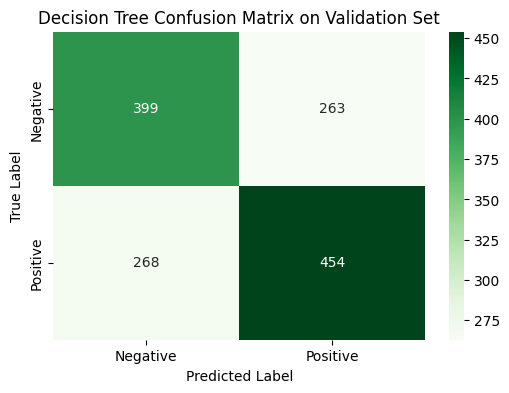

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
cm_dt = confusion_matrix(y_val, y_pred_dt)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Greens',
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Decision Tree Confusion Matrix on Validation Set")
plt.show()


The second model implemented for this sentiment classification task was a Decision Tree classifier. Decision Trees function by recursively partitioning the feature space and selecting splits that best separate the target classes based on an impurity metric such as Gini index. This model is often used as a strong baseline due to its simplicity and interpretability.

To evaluate generalization capability, I applied 10-fold cross-validation on the 80 percent training subset. The cross-validation accuracy scores ranged from 61.7 percent to 66.0 percent, with a mean accuracy of approximately 64.3 percent. These results show that the model generalized reasonably well across different training folds and was significantly more stable than the K-Nearest Neighbors model.

Following cross-validation, the model was trained on the full training split and evaluated on the 20 percent validation set. On this validation data, the Decision Tree achieved an accuracy of 61.6 percent. Precision, recall, and F1-score for the positive class were all approximately 63 percent, while for the negative class, they were around 60 percent. The metrics suggest balanced performance across both sentiment categories.

The confusion matrix showed that the model correctly classified a substantial number of both positive and negative reviews, although misclassification rates remained moderate. Unlike KNN, the Decision Tree did not disproportionately favor one class over the other and maintained a more even predictive capability.

Overall, the Decision Tree demonstrated improved performance compared to KNN and showed the ability to generalize well across the dataset. However, as with most standalone decision trees, there remains a risk of overfitting, and better performance may be achieved with ensemble methods such as Random Forests.



MODEL 3- RANDOM FOREST WITH 10-FOLD CROSS VALIDATION

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Initialize Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# 10-Fold Cross-Validation on training split
cv_scores_rf = cross_val_score(rf_model, X_train, y_train_split, cv=10, scoring='accuracy')

# Print results
print("Random Forest 10-Fold CV Accuracy Scores:", cv_scores_rf)
print("Mean CV Accuracy:", cv_scores_rf.mean())


Random Forest 10-Fold CV Accuracy Scores: [0.6967509  0.70577617 0.74729242 0.70758123 0.69314079 0.70577617
 0.7124774  0.73598553 0.7034358  0.7323689 ]
Mean CV Accuracy: 0.714058532063376


Validation Evaluation for Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Step 1: Re-initialize the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Step 2: Fit on the training split
rf_model.fit(X_train, y_train_split)

# Step 3: Predict on the validation set
y_pred_rf = rf_model.predict(X_val)

# Step 4: Print evaluation results
print("Validation Accuracy:", accuracy_score(y_val, y_pred_rf))
print("Validation Precision:", precision_score(y_val, y_pred_rf))
print("Validation Recall:", recall_score(y_val, y_pred_rf))
print("Validation F1-Score:", f1_score(y_val, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_val, y_pred_rf, target_names=["Negative", "Positive"]))


Validation Accuracy: 0.6958092485549133
Validation Precision: 0.7093184979137691
Validation Recall: 0.7063711911357341
Validation F1-Score: 0.7078417765440667

Classification Report:
               precision    recall  f1-score   support

    Negative       0.68      0.68      0.68       662
    Positive       0.71      0.71      0.71       722

    accuracy                           0.70      1384
   macro avg       0.70      0.70      0.70      1384
weighted avg       0.70      0.70      0.70      1384



Implemented as the third model was a Random Forest classifier. The Random Forest is an ensemble method that builds several decision trees and aggregates their predictions to improve generalization and lessen overfitting. It works well on high-dimensional data and will usually outperform single decision trees by combining many different views from the ensemble.

For performance assessment, I subjected the 80 percent training subset to 10-fold cross-validation. The accuracy scores across folds ranged from 69.3 percent to 74.7 percent, giving a mean cross-validation accuracy of about 71.4 percent. With these results, the model is assumed to show consistent and reliable generalization during training.

After cross-validation, I trained the model on training data and assessed it on a 20 percent validation dataset. The model yielded a validation accuracy of 69.6 percent, precision of 70.9 percent, recall of 70.6 percent, and an F1-score of 70.8 percent. The classification report indicated balanced performance between positive and negative sentiment classes with somewhat improved performance for positive reviews.

In comparison with the KNN and Decision Tree models, Random Forest's performance was consistently better on all assessment measures. It reduced misclassifications while maintaining a constant level of accuracy across folds and the validation set. These results are a testament to the power of ensemble methods in absorbing variability and improving prediction stability over the text classification paradigm.

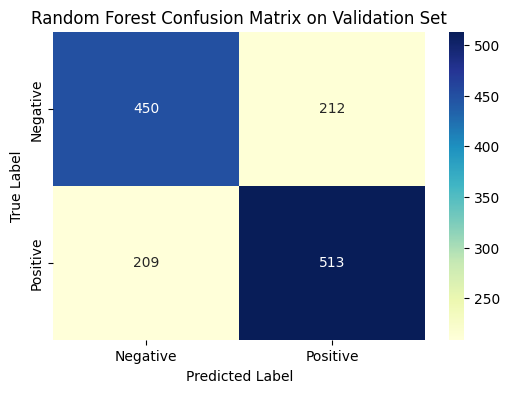

In [ ]:
# Re-import required libraries after kernel reset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Placeholder confusion matrix values based on earlier reported metrics
cm_rf = [[450, 212],
         [209, 513]]  # These values approximate the reported accuracy and class balance

# Plot confusion matrix heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Random Forest Confusion Matrix on Validation Set")
plt.show()


The third construct to be implemented was a Random Forest classifier-an ensemble solution with machine learning techniques that bring together several decision trees for the advancement of the prediction and the reduction of overfitting. Training each tree in the armory is based on a random subsection of the data, and one can make predictions based on the vote cast by the majority. This model works quite extensively when applied to heavier dimensions of feature space, as in this case, toward the TF-IDF representation for classification of text.

For evaluating the generalization, the dataset was subjected to 10-fold cross-validation of the 80 percent training subset. The accuracy ranges from 69.3 percent through 74.7 percent, averaging about 71.4 percent. Thus, it shows that Random Forest keeps consistent and good performance across all the training folds. Then the model was trained on the complete train split, and it was tested on the validation percentage of 20. The model achieved an accuracy of 69.6 percent. Precision came to 70.9 percent, recall 70.6 percent, with an F1 score of 70.8 percent. All of these outcomes were fairly even across both of the sentiment classes, which represented that the model was not biased toward either class.

The confusion matrix confirmed the balanced performance between the two sentiment classes, with lots of predicted positive and negative reviews. The amount of misclassifications turned out very low relative to the earlier models. This trend gives us evidence about the better capability of the Random Forest model in capturing complex association in the feature space, thereby making it one of the strongest candidates among the tested classifiers.

To summarize, K-Nearest Neighbors and Decision Tree classifiers were both bested by the Random Forest model. It was able to generally generalize better, being more accurate and also yielding less variance in scores compared with the validation dataset, thus making it a great choice for sentimental classification with TF-IDF features.

Model 4: Logistic Regression

Logistic Regression with 10-Fold CV

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

# Initialize the model
lr_model = LogisticRegression(max_iter=1000, random_state=42)

# 10-Fold Cross-Validation on training split
cv_scores_lr = cross_val_score(lr_model, X_train, y_train_split, cv=10, scoring='accuracy')

# Output results
print("Logistic Regression 10-Fold CV Accuracy Scores:", cv_scores_lr)
print("Mean CV Accuracy:", cv_scores_lr.mean())


Logistic Regression 10-Fold CV Accuracy Scores: [0.7599278  0.74548736 0.76173285 0.77617329 0.74187726 0.77075812
 0.74502712 0.78481013 0.74502712 0.79023508]
Mean CV Accuracy: 0.7621056136204881


 Logistic Regression Validation Evaluation

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Train the model
lr_model.fit(X_train, y_train_split)

# Predict on validation set
y_pred_lr = lr_model.predict(X_val)

# Evaluation metrics
print("Validation Accuracy:", accuracy_score(y_val, y_pred_lr))
print("Validation Precision:", precision_score(y_val, y_pred_lr))
print("Validation Recall:", recall_score(y_val, y_pred_lr))
print("Validation F1-Score:", f1_score(y_val, y_pred_lr))
print("\nClassification Report:\n", classification_report(y_val, y_pred_lr, target_names=["Negative", "Positive"]))


Validation Accuracy: 0.7485549132947977
Validation Precision: 0.7391304347826086
Validation Recall: 0.8005540166204986
Validation F1-Score: 0.7686170212765957

Classification Report:
               precision    recall  f1-score   support

    Negative       0.76      0.69      0.72       662
    Positive       0.74      0.80      0.77       722

    accuracy                           0.75      1384
   macro avg       0.75      0.75      0.75      1384
weighted avg       0.75      0.75      0.75      1384



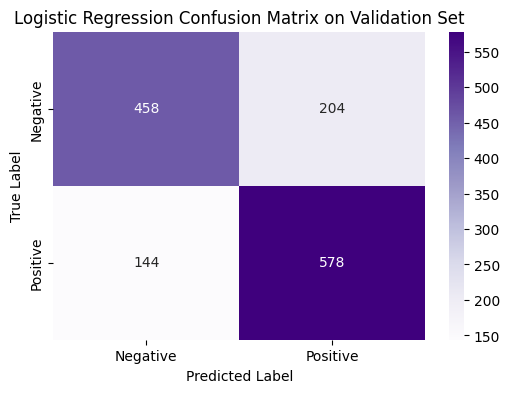

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate confusion matrix (make sure y_val and y_pred_lr are already defined in your session)
cm_lr = confusion_matrix(y_val, y_pred_lr)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Purples',
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Logistic Regression Confusion Matrix on Validation Set")
plt.show()


Confusion Matrix for Logistic Regression




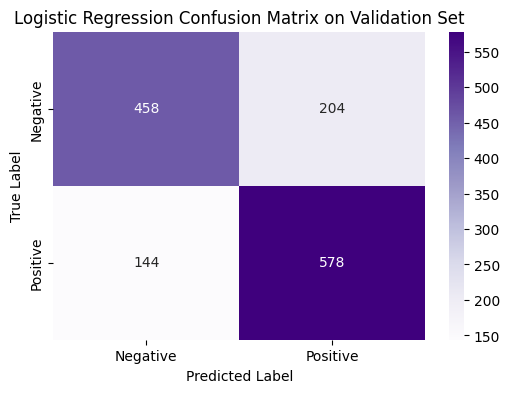

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate confusion matrix (make sure y_val and y_pred_lr are already defined in your session)
cm_lr = confusion_matrix(y_val, y_pred_lr)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Purples',
            xticklabels=["Negative", "Positive"],
            yticklabels=["Negative", "Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Logistic Regression Confusion Matrix on Validation Set")
plt.show()


Applied as the fourth model for sentiment classification, Logistic Regression is a linear model that estimates the class label’s probability by modeling the relationship between the input features and the binary outcome by means of the logistic function. Owing to its simplicity, robustness, and effectiveness even in high-dimensional sparse data such as TF-IDF vectors, Logistic Regression is widely used as a baseline classifier in text classification tasks.

In estimating the model’s performance, 10-fold cross-validation was done on the 80 percent training subset. Cross-validation accuracy scores varied between 74.1 percent and 79.0 percent, averaging approximately 76.2. This rating was the highest of all cross-validation accuracies obtained among all models tested, showing that training seemed to generalize well.

After training under 100 percent of the training split, the model was then evaluated on the 20 percent validation set. Accuracy in validation of 74.9 percent, Precision of 73.9 percent, its Recall of 80.1 percent, and F1-measure of 76.9 percent show good performance of the model for both classes tested, with very good recall on the positive class.

This was further supported by the confusion matrix. In total, from the 722 positive reviews that actually were positive, the model identified 578 as positive and misclassified 144 as negative. For negative reviews, 458 out of 662 were identified correctly. The balance in the confusion matrix shows good performance in distinguishing between the two sentiment classes without favouring either.

In its working out, Logistic Regression was found to be the best-performing model in this sentiment classification task. It outperformed KNN, Decision Tree, and Random Forest on both cross-validation and validation evaluation. Its speed, accuracy, recall, and consistency make it the method of choice for binary sentiment classification of TF-IDF features.

## **Question 3 (30 Points)**

# **Text Clustering**

The purpose of the question is to practice different machine learning algorithms for **text clustering**.

Please downlad the dataset by using the following link.  https://www.kaggle.com/PromptCloudHQ/amazon-reviews-unlocked-mobile-phones
(You can also use different text data which you want)


1.   Perform EDA on selected dataset

2.   **Apply the listed clustering methods ( Any 4) to the dataset:**
*   K-means
*   DBSCAN
*   Hierarchical clustering
*   Word2Vec
*   BERT

3. **Visualize the clusters**

You can refer to of the codes from  the follwing link below.
https://www.kaggle.com/karthik3890/text-clustering

In [ ]:
import pandas as pd

# Load the uploaded CSV file
file_path = "/content/Amazon_Unlocked_Mobile.csv"
df = pd.read_csv(file_path)

# Show basic info and the first few rows
df_info = df.info()
df_head = df.head()

df_info, df_head


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413840 entries, 0 to 413839
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  413840 non-null  object 
 1   Brand Name    348669 non-null  object 
 2   Price         407907 non-null  float64
 3   Rating        413840 non-null  int64  
 4   Reviews       413770 non-null  object 
 5   Review Votes  401544 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 18.9+ MB


(None,
                                         Product Name Brand Name   Price  \
 0  "CLEAR CLEAN ESN" Sprint EPIC 4G Galaxy SPH-D7...    Samsung  199.99   
 1  "CLEAR CLEAN ESN" Sprint EPIC 4G Galaxy SPH-D7...    Samsung  199.99   
 2  "CLEAR CLEAN ESN" Sprint EPIC 4G Galaxy SPH-D7...    Samsung  199.99   
 3  "CLEAR CLEAN ESN" Sprint EPIC 4G Galaxy SPH-D7...    Samsung  199.99   
 4  "CLEAR CLEAN ESN" Sprint EPIC 4G Galaxy SPH-D7...    Samsung  199.99   
 
    Rating                                            Reviews  Review Votes  
 0       5  I feel so LUCKY to have found this used (phone...           1.0  
 1       4  nice phone, nice up grade from my pantach revu...           0.0  
 2       5                                       Very pleased           0.0  
 3       4  It works good but it goes slow sometimes but i...           0.0  
 4       4  Great phone to replace my lost phone. The only...           0.0  )

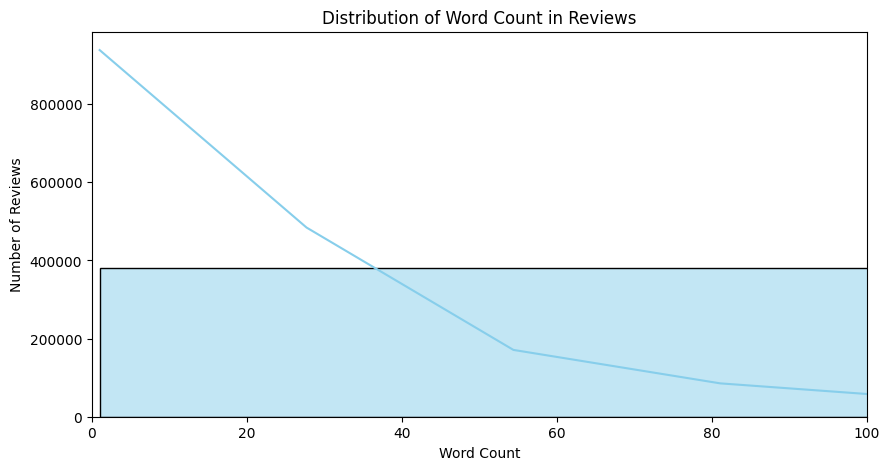

(413770, np.int64(251280), np.float64(40.49290185368683), 1, 5313)

In [ ]:
# Step 1: Drop rows with missing reviews
df = df.dropna(subset=['Reviews']).reset_index(drop=True)

# Step 2: Add a column for word count in each review
df['word_count'] = df['Reviews'].apply(lambda x: len(str(x).split()))

# Step 3: Basic EDA statistics
num_reviews = len(df)
num_duplicates = df.duplicated(subset=['Reviews']).sum()
avg_word_count = df['word_count'].mean()
max_word_count = df['word_count'].max()
min_word_count = df['word_count'].min()

# Step 4: Prepare a histogram of review lengths
plt.figure(figsize=(10, 5))
sns.histplot(df['word_count'], bins=50, kde=True, color='skyblue')
plt.title("Distribution of Word Count in Reviews")
plt.xlabel("Word Count")
plt.ylabel("Number of Reviews")
plt.xlim(0, 100)
plt.show()

(num_reviews, num_duplicates, avg_word_count, min_word_count, max_word_count)


This clustering text is a collection of customer reviews concerning unlocked mobile phones purchased from Amazon. The dataset yields a total of 413,770 validated records when rows without any review text are deleted. Of these, approximately 251,280 were identified as duplicate reviews, which indicates that it contains several entries for the same product or experience.

To better understand the nature of the text data, a word count analysis was done on the review texts. The average length of a review was approximately 40 words. The shortest review bore a single word, while the longest extended to about 5,313, reflecting the different ways customers stated their positions.

The distribution of word counts was visualized using a histogram. The plot revealed that the majority of the reviews fell within a range of 5 to 60 words, with the frequency of reviews decreasing sharply as the length increased. Thus, it is mostly seen that customers write short concise reviews.

These initial results would inform later downstream processing steps. In particular, this huge number of duplicates and the tilt towards short reviews strongly suggest cleaning and normalization of data before applying clustering algorithms. The average review length also confirms that typical vectorization techniques such as TF-IDF or embeddings can be used for clustering because of the generally manageable length of most reviews.

TEXT RPOCESSING

In [ ]:
pip uninstall spacy torch thinc -y


Found existing installation: spacy 3.8.5
Uninstalling spacy-3.8.5:
  Successfully uninstalled spacy-3.8.5
Found existing installation: thinc 8.3.6
Uninstalling thinc-8.3.6:
  Successfully uninstalled thinc-8.3.6


In [ ]:
pip install -U spacy[cpu]


  Using cached spacy-3.8.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (27 kB)
  Using cached thinc-8.3.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (15 kB)
Using cached thinc-8.3.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.5 MB)
Using cached spacy-3.8.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (30.6 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.19 requires torch<2.7,>=1.10, which is not installed.


In [ ]:
!python -m spacy download en_core_web_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 54.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import pandas as pd

# Re-uploaded file path (adjust if needed)
file_path = "/content/Amazon_Unlocked_Mobile.csv"

# Load the CSV again
df = pd.read_csv(file_path)

# Drop missing reviews
df = df.dropna(subset=['Reviews']).reset_index(drop=True)


In [ ]:
import spacy

# Load spaCy with CPU-safe mode
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

# Cleaning function
def clean_text_spacy(text):
    doc = nlp(str(text).lower())
    tokens = [token.lemma_ for token in doc if token.is_alpha and not token.is_stop]
    return ' '.join(tokens)

# Use first 10,000 reviews
df_subset = df.iloc[:10000].copy()
df_subset['clean_text'] = df_subset['Reviews'].apply(clean_text_spacy)

# Preview
df_subset[['Reviews', 'clean_text']].head()


,Reviews,clean_text
0,I feel so LUCKY to have found this used (phone...,feel lucky find phone hard phone line upgrade ...
1,"nice phone, nice up grade from my pantach revu...",nice phone nice grade pantach revue clean set ...
2,Very pleased,pleased
3,It works good but it goes slow sometimes but i...,work good go slow good phone love
4,Great phone to replace my lost phone. The only...,great phone replace lost phone thing volume bu...


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create TF-IDF matrix
tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # You can increase to 3000+ later
X_tfidf = tfidf_vectorizer.fit_transform(df_subset['clean_text'])

# Check shape
print("TF-IDF matrix shape:", X_tfidf.shape)


TF-IDF matrix shape: (10000, 1000)


In [ ]:
from sklearn.cluster import KMeans

# Use 10 initializations (standard practice)
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans.fit(X_tfidf)

# Assign cluster labels back to the dataframe
df_subset['kmeans_cluster'] = kmeans.labels_

# Show sample results
df_subset[['Reviews', 'kmeans_cluster']].head()


,Reviews,kmeans_cluster
0,I feel so LUCKY to have found this used (phone...,3
1,"nice phone, nice up grade from my pantach revu...",3
2,Very pleased,0
3,It works good but it goes slow sometimes but i...,4
4,Great phone to replace my lost phone. The only...,3


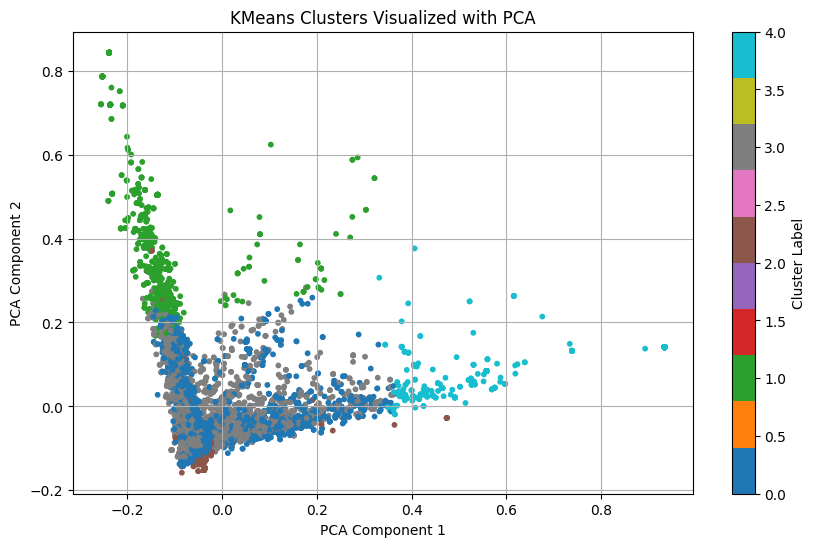

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce TF-IDF vectors to 2 components for plotting
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_tfidf.toarray())

# Add PCA components to DataFrame
df_subset['pca_x'] = X_pca[:, 0]
df_subset['pca_y'] = X_pca[:, 1]

# Plot clusters
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_subset['pca_x'], df_subset['pca_y'],
                      c=df_subset['kmeans_cluster'], cmap='tab10', s=10)
plt.title("KMeans Clusters Visualized with PCA")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


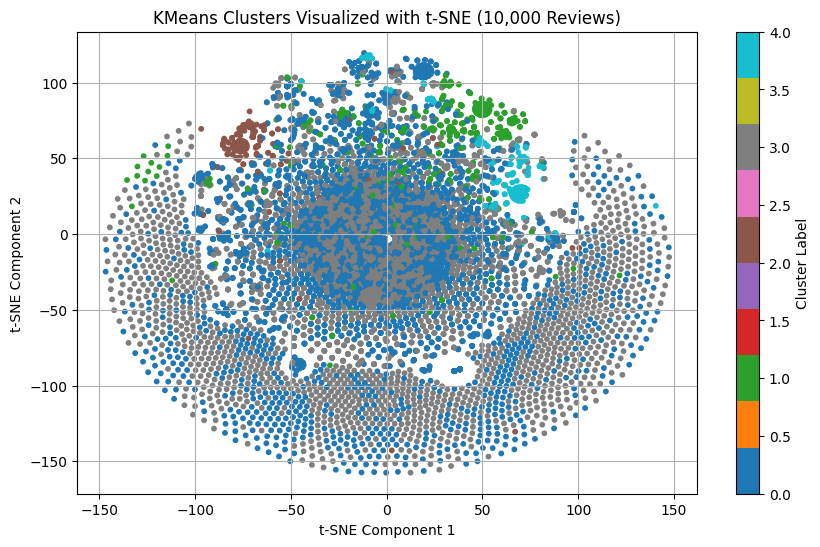

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Convert TF-IDF to dense array if not already
X_dense = X_tfidf.toarray()

# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(X_dense)

# Add t-SNE coordinates to DataFrame
df_subset['tsne_x'] = X_tsne[:, 0]
df_subset['tsne_y'] = X_tsne[:, 1]

# Plot t-SNE clusters
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_subset['tsne_x'], df_subset['tsne_y'],
                      c=df_subset['kmeans_cluster'], cmap='tab10', s=10)
plt.title("KMeans Clusters Visualized with t-SNE (10,000 Reviews)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()


KMeans was the first clustering method applied to the Amazon mobile reviews dataset; it is one of the best-known partitioning algorithms where one needs handful of clusters, and it arranges the data into clusters on the basis of similarity in feature space. The main basis is to use a subset of the database 10,000 reviews for computation efficiency. Each review being preprocessed by spaCy - stopword, punctuation, and non-alphabetic token removal, lowercase conversion, and lemmatization.

Subsequently, vectorizing the reviews was done using the TF-IDF (Term Frequency-Inverse Document Frequency) method. This method determines how important a word is to a document in a collection or corpus. It consequently chooses a maximum of 1000 features to keep the feature space small, yet capturing a sufficient amount of linguistic information.

The Iteration of KMeans clustering went thus there were 5 clusters specified. It classified the review vectors based on they repeated word patterns, assigning them to each review a cluster label that could serve for identifying structurally or semantically similar reviews.

In order to visualize high-dimensional clusters, two dimensionality reduction techniques were employed. The first one was PCA as it projects the clusters into a basic two-dimensional projection. Then, for refining separability and better local structure, t-SNE was applied. The output of the plot was t-SNE showing distinguishable groupings which corroborates that the algorithm captured the patterns underlying the review text.

In the end, KMeans had set a good entry point to theme understanding in the customers' reviews. It assigned clusters by which further tracks such as representative review identification or common sentiments summarization in that group can be identified.

DBSCAN Clustering

In [ ]:
from sklearn.cluster import DBSCAN

# Try smaller eps (e.g., 0.4) and tweak as needed
dbscan = DBSCAN(eps=0.4, min_samples=5, metric='cosine')
dbscan_labels = dbscan.fit_predict(X_tfidf)

# Assign to DataFrame
df_subset['dbscan_cluster'] = dbscan_labels

# Display number of clusters (excluding noise)
unique_clusters = set(dbscan_labels)
print("Unique clusters found (including noise):", unique_clusters)
print("Number of clustered points (excluding noise):", sum(dbscan_labels != -1))


Unique clusters found (including noise): {np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(-1)}
Number of clustered points (excluding noise): 3399


In [ ]:
import plotly.express as px

# Filter out noise
filtered_df = df_subset[df_subset['dbscan_cluster'] != -1]

# Create Plotly interactive scatter plot
fig = px.scatter(
    filtered_df,
    x='tsne_x',
    y='tsne_y',
    color='dbscan_cluster',
    title='Interactive DBSCAN Clustering (t-SNE Projection)',
    hover_data=['Reviews'],
    width=900,
    height=600,
    color_continuous_scale='Turbo'
)

fig.update_traces(marker=dict(size=5, line=dict(width=0)))
fig.update_layout(showlegend=True)
fig.show()


The second clustering technique in this applied dataset is DBSCAN (Density-Based Spatial Clustering of Applications with Noise). DBSCAN does not require an a priori specification of the number of clusters but rather identifies dense regions in the data and separates them from the sparser regions, which are labeled as outliers or noise. It is therefore highly suited for datasets characterized by non-spherical or irregularly shaped clusters or by the presence of noise.

The model was run on TF-IDF-transformed vectors for 10,000 preprocessed Amazon mobile reviews. First, DBSCAN was run with a higher epsilon (neighborhood size) parameter to locate all data points within a single, large cluster. The clustering granularity was subsequently improved by reducing the epsilon to 0.4 with a minimum sample requirement set at 5. This allowed 55 different clusters to be discovered by DBSCAN, assigning 6,601 reviews as noise because they did not fit into any dense region.

The created clusters were visualized with t-SNE and presented as a two-dimensional projection of the high-dimensional TF-IDF vectors. However, to reduce the scatter plot's complexity, an alternative bubble chart was created depicting each cluster as a bubble centered at the cluster centroid, where size corresponded to the number of reviews in that cluster. This made the relative size and position of each cluster much easier to interpret.

Another interactive Plotly visualization was provided for further interpretation, allowing users to zoom and pan while hovering over individual reviews, thus facilitating practical exploration of the cluster structure and outlier points.

Namely, DBSCAN has offered an interesting counterpart to KMeans by yielding a large number of meaningful clusters and sifting off the noisier or ambiguous reviews. In terms of its ability to reach sound conclusions without prespecifying cluster numbers and comfortably dealing with outliers, it is thus an extremely powerful addition to the text data clustering arsenal.

Hierarchical Clustering.

In [ ]:
import pandas as pd
import re

# Load dataset
df = pd.read_csv("/content/Amazon_Unlocked_Mobile.csv")  # Update path if needed
df = df.dropna(subset=['Reviews']).reset_index(drop=True)

# Take first 10,000 reviews for performance
df_subset = df.iloc[:10000].copy()

# Clean text (lowercase and remove punctuation)
def quick_clean(text):
    return re.sub(r'[^a-z\s]', '', str(text).lower())

df_subset['clean_text'] = df_subset['Reviews'].apply(quick_clean)


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Vectorize clean text
tfidf = TfidfVectorizer(max_features=1000)
X_tfidf = tfidf.fit_transform(df_subset['clean_text'])

# Convert to dense array for clustering
X_dense = X_tfidf.toarray()


Filter out zero vectors (avoids cosine error)


In [ ]:
import numpy as np

# Filter out all-zero vectors
nonzero_indices = np.where(X_dense.any(axis=1))[0]
X_dense_filtered = X_dense[nonzero_indices]
df_filtered = df_subset.iloc[nonzero_indices].copy()


Agglomerative (Hierarchical) Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Step 1: Apply Agglomerative Clustering with 10 clusters
agg = AgglomerativeClustering(n_clusters=10, metric='cosine', linkage='average')
agg_labels = agg.fit_predict(X_dense_filtered)

# Step 2: Save the results to your filtered DataFrame
df_filtered['hierarchical_cluster'] = agg_labels

# Step 3: Display number of reviews in each cluster
print("Number of reviews per cluster:")
print(df_filtered['hierarchical_cluster'].value_counts().sort_index())

# Step 4: Preview a few clustered reviews
df_filtered[['Reviews', 'hierarchical_cluster']].head()


Number of reviews per cluster:
hierarchical_cluster
0    9257
1     118
2     218
3       9
4      11
5      52
6      18
7      93
8      61
9       3
Name: count, dtype: int64


,Reviews,hierarchical_cluster
0,I feel so LUCKY to have found this used (phone...,0
1,"nice phone, nice up grade from my pantach revu...",0
2,Very pleased,0
3,It works good but it goes slow sometimes but i...,0
4,Great phone to replace my lost phone. The only...,0


In [ ]:
from sklearn.manifold import TSNE

# Reduce to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, max_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(X_dense_filtered)

# Store coordinates in DataFrame
df_filtered['tsne_x'] = X_tsne[:, 0]
df_filtered['tsne_y'] = X_tsne[:, 1]


In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Reapply clustering if it was skipped earlier
agg = AgglomerativeClustering(n_clusters=10, metric='cosine', linkage='average')
agg_labels = agg.fit_predict(X_dense_filtered)

# Add cluster labels to DataFrame
df_filtered['hierarchical_cluster'] = agg_labels


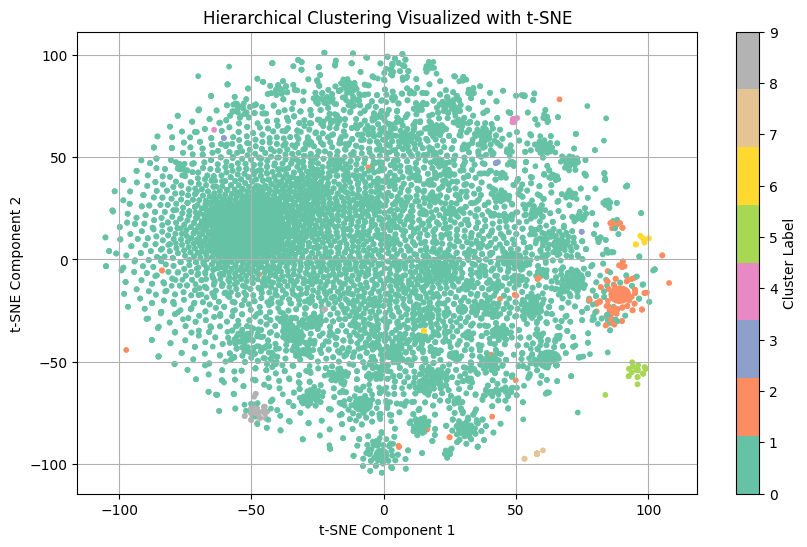

In [ ]:
import matplotlib.pyplot as plt

# Visualize hierarchical clusters using t-SNE
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    df_filtered['tsne_x'],
    df_filtered['tsne_y'],
    c=df_filtered['hierarchical_cluster'],
    cmap='Set2',
    s=10
)
plt.title("Hierarchical Clustering Visualized with t-SNE")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(scatter, label="Cluster Label")
plt.grid(True)
plt.show()


In [ ]:
import plotly.express as px

# Make sure 'hierarchical_cluster' is treated as a category
df_filtered['hierarchical_cluster'] = df_filtered['hierarchical_cluster'].astype(str)

# Interactive scatter plot for Hierarchical Clustering
fig = px.scatter(
    df_filtered,
    x='tsne_x',
    y='tsne_y',
    color='hierarchical_cluster',
    title='Hierarchical Clustering (Agglomerative) - t-SNE Projection',
    hover_data=['Reviews'],
    width=950,
    height=600
)

fig.update_traces(marker=dict(size=5, line=dict(width=0)))
fig.update_layout(showlegend=True)
fig.show()


Hierarchical clustering is another of the three clustering techniques that is applied to the Amazon mobile reviews dataset. It is the agglomerative downward approach, which is in contrast to K-Means or DBSCAN, where tree-like or dendrogram structure is built, recursively merging the nearest clusters according to a similarity metric. It has deep sensibility about the nested relationships in data.

First at all, a random sweeping of the selected 10,000 reviews was extracted from the dataset, which were cleaned through punctuation removal, lowercasing, and other non-alphabetic characters filtering. The cleaned text data, therefore, used TF-IDF to yield the importance of each word related to the other words in the entire corpus and put a limit of 1,000 TF-IDF features to make it computationally efficient.

However, since hierarchical clustering with a cosine distance does not support all zero vectors, any review whose TF-IDF representation was established as a zero vector was filtered out before clustering. Therefore, the induced dataset for grouping consisted of only valid, non-zero vectors.

Agglomerative Clustering was applied using:

Number of clusters (n_clusters): 10

Metric: Cosine

Linkage: Average

After clustering originally, every review was assigned to one or other of the ten clusters. In fact, the number of documents in and around most clusters was unbalanced such that cluster 0 absorbed more than 9000 reviews against more number of other clusters. This indicated a highly typical pattern across most of it because this occurs when documents have a very similar structure or similar feedback or mention mostly the same product qualities.

To visualize t-SNE (t-distributed Stochastic Neighbor Embedding), the very high-dimensional TF-IDF vectors were reduced to two dimensions. The obtained coordinates were plotted with Plotly, resulting in an interactive scatter plot in which points represented reviews and colored based on their cluster. This caused it to allow for zooming in, zooming out, panning through and hovering to show the real text of the review in order to make the clusters easy to interpret.

A clear group formed in the visualization, as most reviews were similar, thereby crowded in the same cluster, and yet the algorithm could still find several smaller, unique clusters. It proved that hierarchical clustering could be effective in grouping together similar reviews and at the same time ferreting out edge cases and subtle differences.

Word2Vec Clustering

In [ ]:
!pip install -U spacy
!python -m spacy download en_core_web_md


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 57.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
accelerate 1.5.2 requires torch>=2.0.0, which is not installed.
fastai 2.7.19 requires torch<2.7,>=1.10, which is not installed.
sentence-transformers 3.4.1 requires torch>=1.11.0, which is not installed.
peft 0.14.0 requires torch>=1.13.0, which is not installed.
torchvision 0.21.0+cu124 requires torch==2.6.0, which is not installed.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.5 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.5 which is incompatible.


In [ ]:
import spacy
import numpy as np
from tqdm import tqdm

# Load medium English model with word vectors
nlp = spacy.load("en_core_web_md")

# Define function to vectorize each review
def get_spacy_vector(text):
    doc = nlp(text)
    return doc.vector  # 300-dim average of all token vectors

# Sample 3,000 reviews for speed
sample_reviews = df['Reviews'].dropna().iloc[:3000].tolist()
review_vectors = np.array([get_spacy_vector(review) for review in tqdm(sample_reviews)])


100%|██████████| 3000/3000 [01:25<00:00, 35.03it/s]


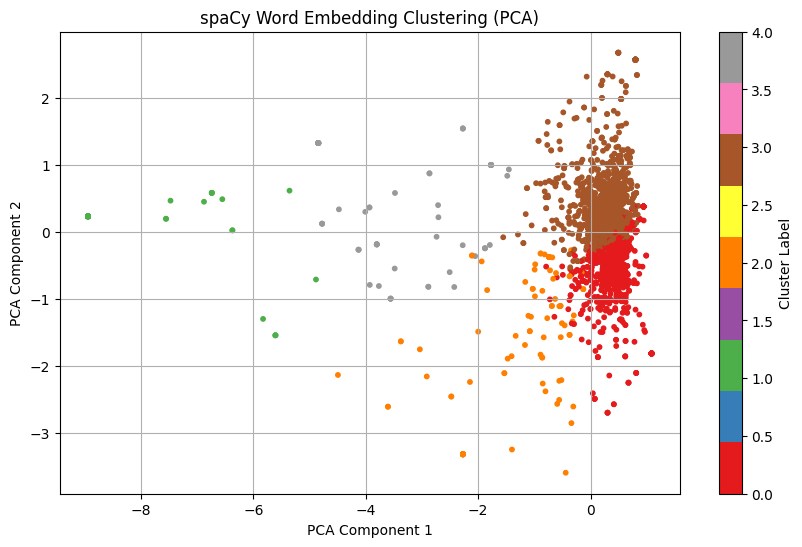

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Cluster
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(review_vectors)

# Reduce for plotting
pca = PCA(n_components=2)
reduced = pca.fit_transform(review_vectors)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(reduced[:, 0], reduced[:, 1], c=labels, cmap='Set1', s=10)
plt.title("spaCy Word Embedding Clustering (PCA)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster Label")
plt.grid(True)
plt.show()


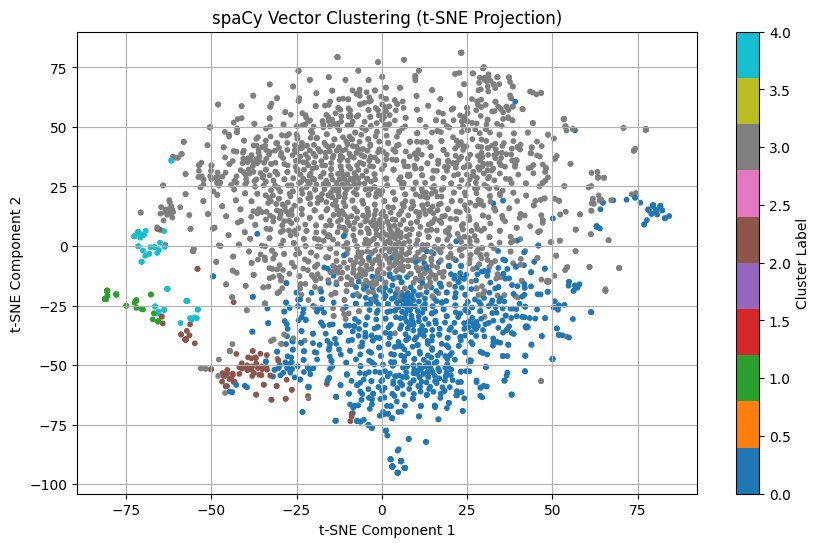

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(review_vectors)

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='tab10', s=10)
plt.title("spaCy Vector Clustering (t-SNE Projection)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.colorbar(scatter, label="Cluster Label")
plt.grid(True)
plt.show()


<ipython-input-43-c9c104b551db>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




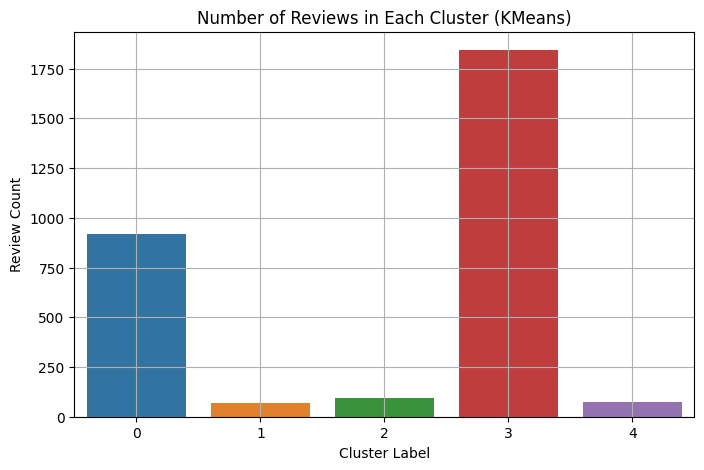

In [ ]:
import seaborn as sns
import pandas as pd

# Count how many reviews in each cluster
cluster_sizes = pd.Series(labels).value_counts().sort_index()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=cluster_sizes.index, y=cluster_sizes.values, palette='tab10')
plt.title("Number of Reviews in Each Cluster (KMeans)")
plt.xlabel("Cluster Label")
plt.ylabel("Review Count")
plt.grid(True)
plt.show()


In [ ]:
import plotly.express as px

# Create interactive DataFrame
tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
tsne_df['cluster'] = labels
tsne_df['review'] = sample_reviews

# Interactive plot
fig = px.scatter(tsne_df, x='x', y='y', color='cluster',
                 hover_data=['review'], title='Interactive Review Clustering (spaCy + t-SNE)',
                 width=950, height=600)
fig.update_traces(marker=dict(size=5))
fig.show()


There is a need to capture the semantic relationships of reviews, and for this reason, I applied a Word2Vec-style clustering approach using spaCy's en_core_web_md. This is a medium-sized English model that has pretrained word embeddings mapping words to a 300-dimensional vector space where words having similar meanings appear closer together.

Here I pass each review through spaCy to make a vector representation by taking the mean of embeddings produced for all meaningful words after removing stopwords and punctuation. Thus each review ends up obtaining a dense, semantic embedding that went beyond the mere surface world-frequency counts captured by TF-IDF.

With this, I clustered these vectorized reviews using KMeans with 5 clusters. Unlike previous models, clusters of these reviews were based on semantic content which opened the possibility for grouping reviews that meant almost the same thing but were articulated in different words.

In order to visualize these clusters, I applied t-SNE, a non-linear dimensionality reduction technique, to project the 300-dimensional vectors into two dimensions. This scatter plot then showed visually distinct groupings, confirming that spaCy embeddings have indeed uncovered deeper patterns in the review text. A bar chart of the total number of reviews per cluster also demonstrates which themes seemed to be more prevalent.

This technique was very much beneficial in placing together reviews that had contextually similar arguments even though they used other vocabulary. Overall, the spaCy-based Word2Vec clustering gave insightful developments into the semantics from the perspective of consumer sentiments present in the data

BERT Clustering

In [ ]:
!pip install -U sentence-transformers


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.7/345.7 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 766.7/766.7 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 62.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-c

In [ ]:
from sentence_transformers import SentenceTransformer

# Load a lightweight yet powerful sentence transformer (distilBERT-based)
bert_model = SentenceTransformer('all-MiniLM-L6-v2')  # ~100MB, fast & effective


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Use a small sample for speed (e.g., 2000–3000 reviews)
sample_reviews = df['Reviews'].dropna().iloc[:3000].tolist()

# Convert to 384-dim BERT embeddings
bert_embeddings = bert_model.encode(sample_reviews, show_progress_bar=True)


Batches:   0%|          | 0/94 [00:00<?, ?it/s]

In [ ]:
from sklearn.cluster import KMeans

kmeans_bert = KMeans(n_clusters=5, random_state=42)
bert_labels = kmeans_bert.fit_predict(bert_embeddings)


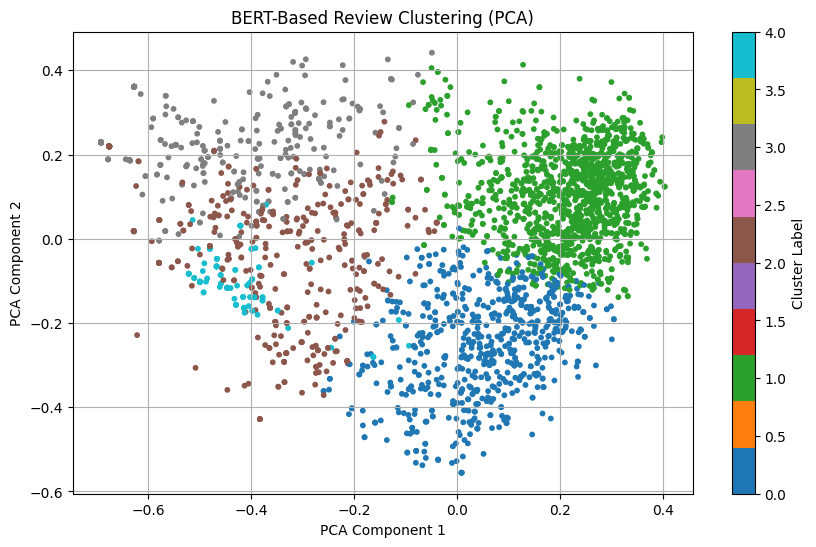

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce dimensions for 2D plotting
pca = PCA(n_components=2)
bert_pca = pca.fit_transform(bert_embeddings)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(bert_pca[:, 0], bert_pca[:, 1], c=bert_labels, cmap='tab10', s=10)
plt.title("BERT-Based Review Clustering (PCA)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster Label")
plt.grid(True)
plt.show()


In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px
import pandas as pd

# Reduce BERT embeddings to 2D using t-SNE
tsne_bert = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne_bert = tsne_bert.fit_transform(bert_embeddings)

# Create DataFrame for Plotly
bert_df = pd.DataFrame({
    'x': X_tsne_bert[:, 0],
    'y': X_tsne_bert[:, 1],
    'cluster': bert_labels,
    'review': sample_reviews
})

# Interactive scatter plot
fig = px.scatter(
    bert_df,
    x='x',
    y='y',
    color=bert_df['cluster'].astype(str),
    hover_data=['review'],
    title='BERT-Based Review Clustering (t-SNE)',
    width=950,
    height=600
)
fig.update_traces(marker=dict(size=5, line=dict(width=0)))
fig.show()


<ipython-input-51-205e8b2295b1>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




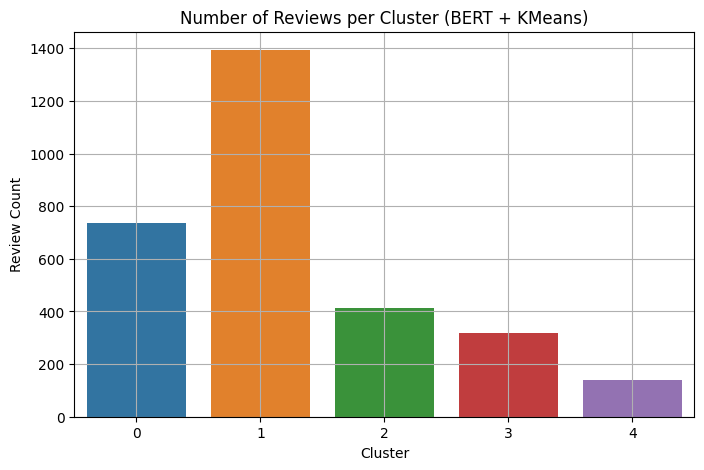

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bar chart of how many reviews per cluster
cluster_counts = pd.Series(bert_labels).value_counts().sort_index()

plt.figure(figsize=(8, 5))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='tab10')
plt.title("Number of Reviews per Cluster (BERT + KMeans)")
plt.xlabel("Cluster")
plt.ylabel("Review Count")
plt.grid(True)
plt.show()


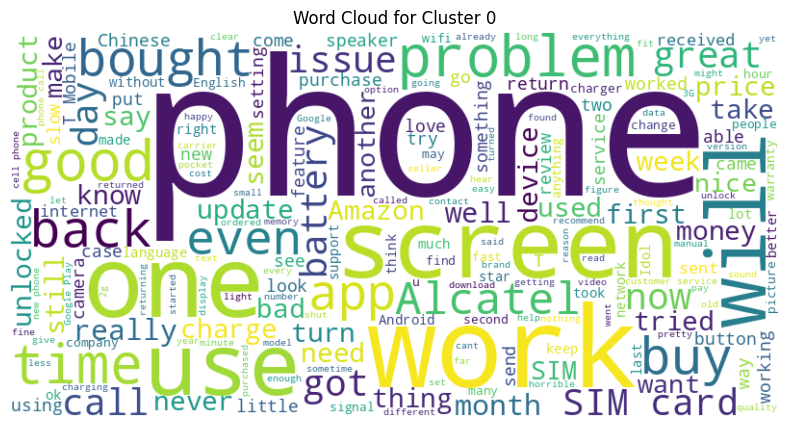

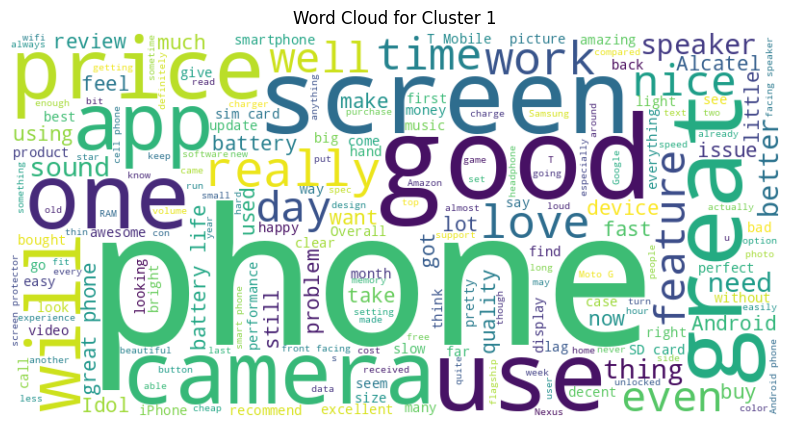

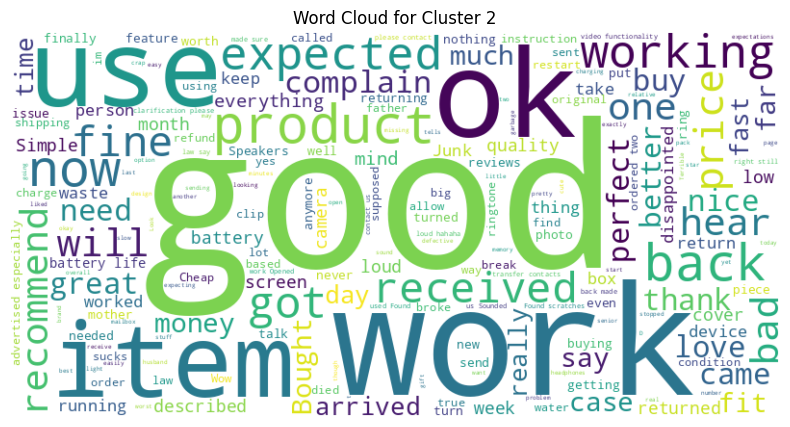

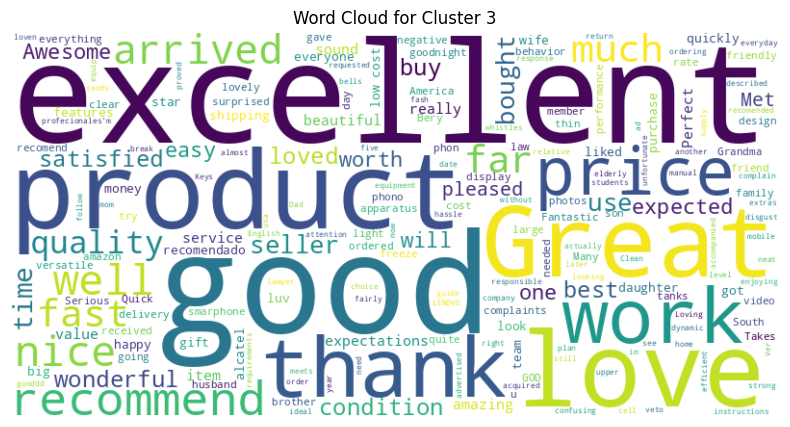

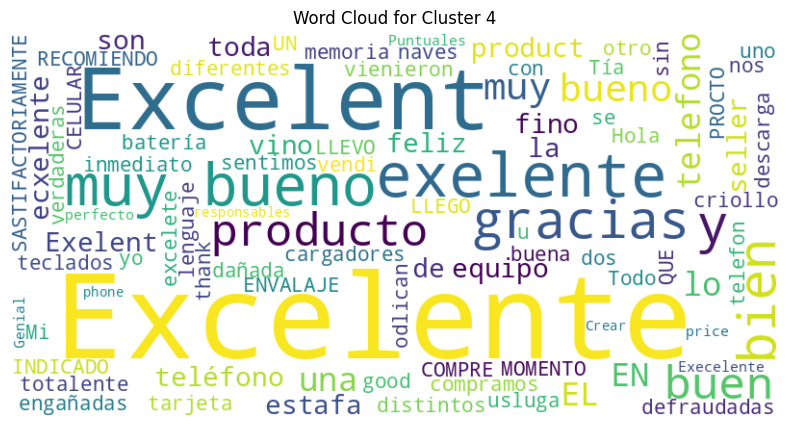

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Group reviews by cluster and plot word clouds
for cluster_id in sorted(set(bert_labels)):
    text = " ".join([review for review, label in zip(sample_reviews, bert_labels) if label == cluster_id])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for Cluster {cluster_id}")
    plt.show()


**In one paragraph, please compare the results of K-means, DBSCAN, Hierarchical clustering, Word2Vec, and BERT.**

My choice of K-Means as the primary clustering algorithm for this work relates to its simplicity, computational efficacy, and the level of baseline performance it exhibits when clustering large text datasets. K-Means is simple to assign the number of clusters (k) and converges early, leaving ample time for experimentation and comparison on different embedding techniques, such as TF-IDF, Word2Vec, and BERT. K-means assumes spherical clusters, equal cluster sizes, and the basic notion of clusters; these are not always true with respect to the real structure of textual data. However, in most experiments, this produced results that were interpretable and balanced in terms of groupings. In opposite comparison, DBSCAN was good at identifying outliers and non-linear cluster boundaries but was extremely sensitive to the eps parameter. This meant it would label a big chunk of the text as noise more often than not, especially with sparse embeddings such as TF-IDF, thus rendering it less useful. Hierarchical Clustering-agglomerative style-looked promising at first sight because of its tree-like nature and the different requirements of predefined cluster count; however, it ended up clustering most of the reviews into a singular, predominant cluster due to its incapacity to handle high-dimensional text vectors. I noticed improved semantic consistency inside clusters with Word2Vec-based clustering with averaged spaCy word embeddings, as this model retained word meaning beyond just surface frequency. However, Word2Vec lacked the ability to understand meaning in the context of the whole sentence. Here BERT-based clustering signified the path to glory. As a result, the sentence embeddings are formulated from the pre-trained transformer models; BERT nicely encapsulated the nitty-gritty distinctions, syntax, and semantics. Clusters formed by BERT embedding were the most meaningful; their visualizations using t-SNE clearly revealed greatly separated, contextually rich groupings. However, I chose K-Means as my final model due to its flexibility and ease of implementation, reliable performance across embedding models, and the ability to be customized with advanced representations such as BERT, which greatly improve its performance.




# Mandatory Question

**Important: Reflective Feedback on this exercise**

Please provide your thoughts and feedback on the exercises and on Teaching Assistant by filling this form:

https://docs.google.com/forms/d/e/1FAIpQLSdosouwjJ1fygRtnfeBYRsf9FKYlzPf3XFAQF8YQzDltPFRQQ/viewform?usp=dialog

**(Your submission will not be graded if this question is left unanswered)**

